In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%pip install pillow_heif
import pillow_heif

In [ ]:
!unzip '/content/cv_query.zip'

In [ ]:
def read_heic(img_path):
  heif_file = pillow_heif.open_heif(img_path, convert_hdr_to_8bit=False, bgr_mode=False)
  img = np.array(heif_file)
  return img

In [ ]:
img = read_heic('/content/cv_query/groud.HEIC')
def rectify(h):
  h = h.reshape((4,2))
  hnew = np.zeros((4,2),dtype = np.float32)

  add = h.sum(1)
  hnew[0] = h[np.argmin(add)]
  hnew[2] = h[np.argmax(add)]
  used = []
  used.extend([np.argmin(add),np.argmax(add)])

  diff = np.diff(h,axis = 1).reshape(-1)
  diff[used] = int(10**6)
  hnew[1] = h[np.argsort(diff)[0]]
  hnew[3] = h[np.argsort(diff)[1]]

  return hnew

def get_cards_from_photo(img_RGB,threshhold=120):
  gray = cv2.cvtColor(img_RGB, cv2.COLOR_BGR2GRAY)
  flag, thresh = cv2.threshold(gray, threshhold, 255, cv2.THRESH_BINARY_INV)
  contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  contours_sorted = np.array(sorted(contours, key=cv2.contourArea,reverse=True))
  area_ar_bool = np.array([cv2.contourArea(contour)<500000 for contour in contours_sorted])
  warps = []
  boxes = []
  square = cv2.contourArea(contours_sorted[area_ar_bool][0])
  for card in contours_sorted:
      square_card = cv2.contourArea(card)
      if 0.5<square_card/square<1.2:
        peri = cv2.arcLength(card,True)
        approx = cv2.approxPolyDP(card, 0.01 * peri, True)
        if approx.shape[0] * approx.shape[1] * approx.shape[2] == 8:
          box = np.intp(rectify(approx))
          boxes.append(box)
          h = np.array([[0,0], [256,0], [256,256], [0,256]], np.float32)
          transform = cv2.getPerspectiveTransform(rectify(approx), h)
          warp = cv2.warpPerspective(img_RGB, transform,(256,256))
          warps.append(warp)
        else:
          continue
  return warps, boxes

def imgdiff(img1,img2):
  _,img1 = cv2.threshold(cv2.cvtColor(cv2.GaussianBlur(img1,(3,3),3),cv2.COLOR_BGR2GRAY),140,255,cv2.THRESH_BINARY_INV)
  _,img2 = cv2.threshold( cv2.cvtColor(cv2.GaussianBlur(img2,(3,3),3),cv2.COLOR_BGR2GRAY),140,255,cv2.THRESH_BINARY_INV)
  diff = cv2.absdiff(img1,img2)
  diff = cv2.GaussianBlur(diff,(5,5),5)
  #flag, diff = cv2.threshold(diff, 50, 255, cv2.THRESH_BINARY)
  return diff

def get_matches(query_cards, ground_cards,plot=True,title_name='Query'):
  titles = []
  if plot:
    fig, axs = plt.subplots(len(query_cards), 3,figsize=(15, 15))
  a = 0
  for query in query_cards:
    best_id = 100
    best_value = float('inf')
    best_diff = float('inf')
    for i, ground in enumerate(ground_cards):
      for _ in range(4):
        query = np.rot90(query)
        diff = imgdiff(ground, query)
        if np.sum(diff) < best_value:
          best_value = np.sum(diff)
          best_id = i
          best_diff = diff
    titles.append(best_id)
    if plot:
      axs[a][0].imshow(ground_cards[best_id])
      axs[a][1].imshow(query)
      axs[a][2].imshow(best_diff)
    a += 1
  if plot:
    axs[0][0].set_title('Ground truth card')
    axs[0][1].set_title('Query card')
    axs[0][2].set_title('Difference between Ground/Query')
    fig.suptitle(f'Best matches Query_{title_name}', fontsize=20)
    plt.show();
  return titles

def plot_image_with_boxes(image,boxes):
  plt.figure(figsize=(15, 5))
  for b in boxes:
    cv2.drawContours(image,[b], 0, (255, 255, 0), 25)
  #im = cv2.resize(image, (1500, 3000))
  plt.title('Query Cards_0')
  plt.axis('off')
  plt.imshow(np.rot90(image))
  plt.show();

In [ ]:
ground_cards, ground_boxes = get_cards_from_photo(img,80)

<ipython-input-206-bfb355327fb2>:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours_sorted = np.array(sorted(contours, key=cv2.contourArea,reverse=True))


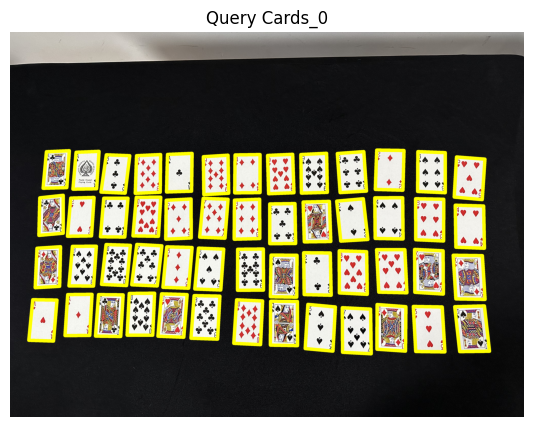

In [ ]:
plot_image_with_boxes(img, ground_boxes)

In [ ]:
import os
path_close = '/content/cv_query/close'
path_normal = '/content/cv_query/normal'
path_far = '/content/cv_query/far'
query_close = os.listdir(path_close)
query_normal = os.listdir(path_normal)
query_far = os.listdir(path_far)

In [ ]:
distances = [query_close, query_normal, query_far]

<ipython-input-227-8c3c50f1470e>:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours_sorted = np.array(sorted(contours, key=cv2.contourArea,reverse=True))


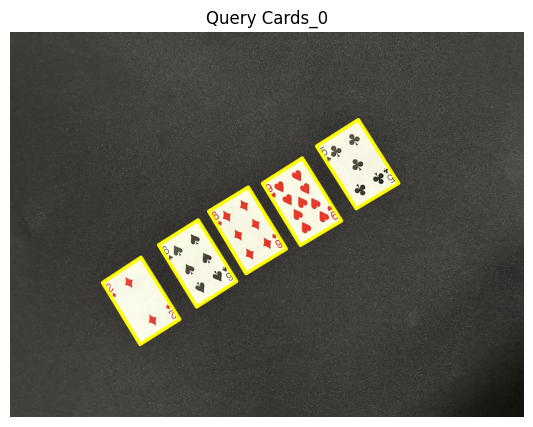

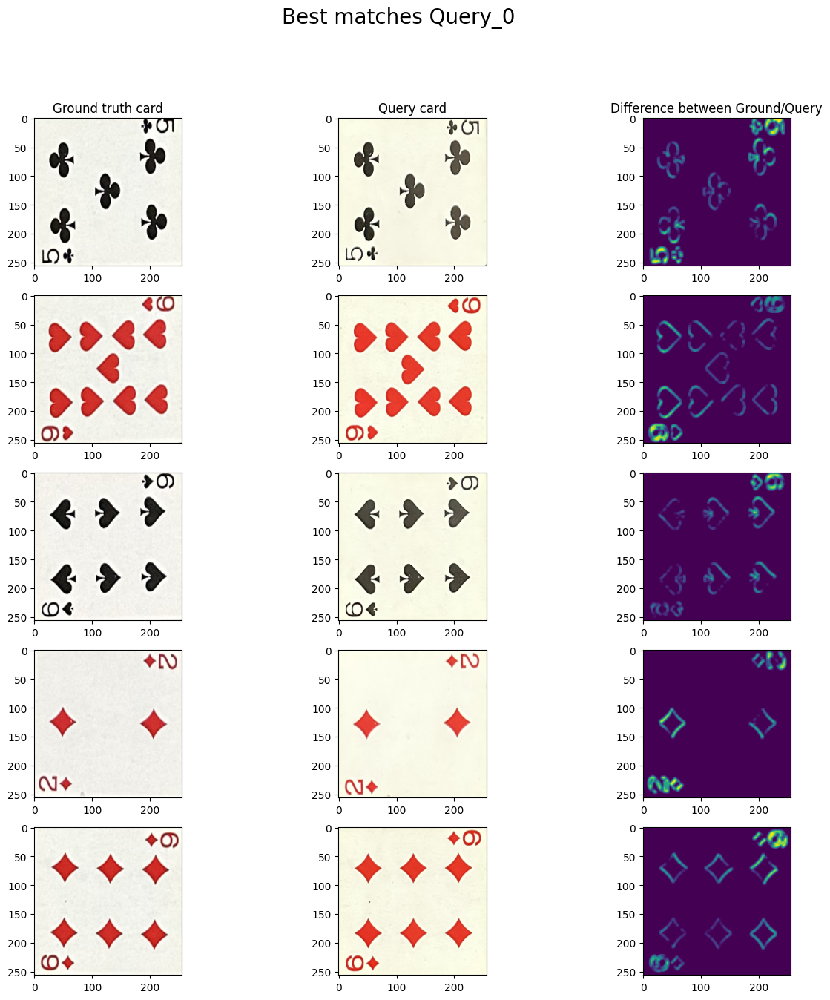

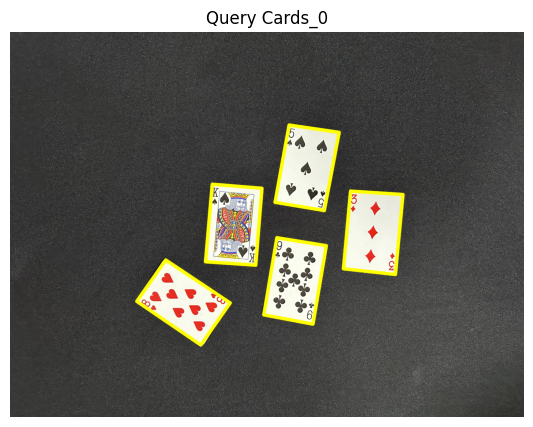

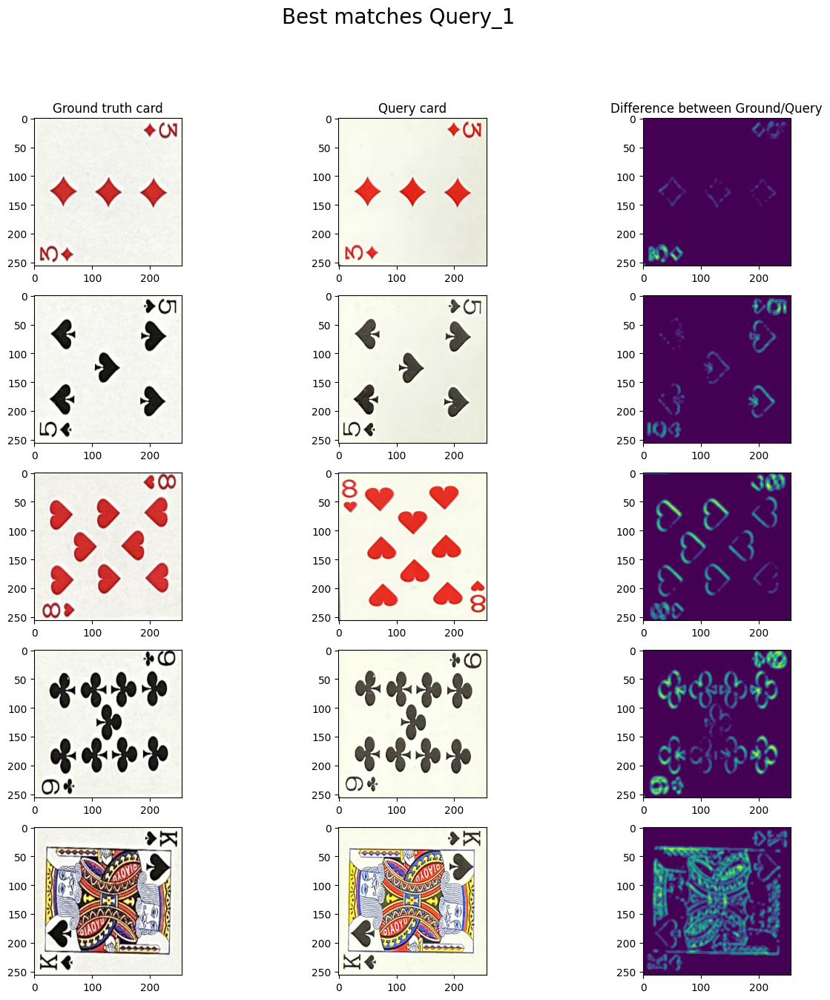

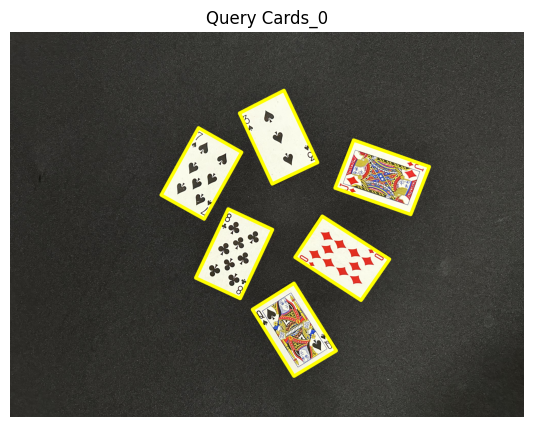

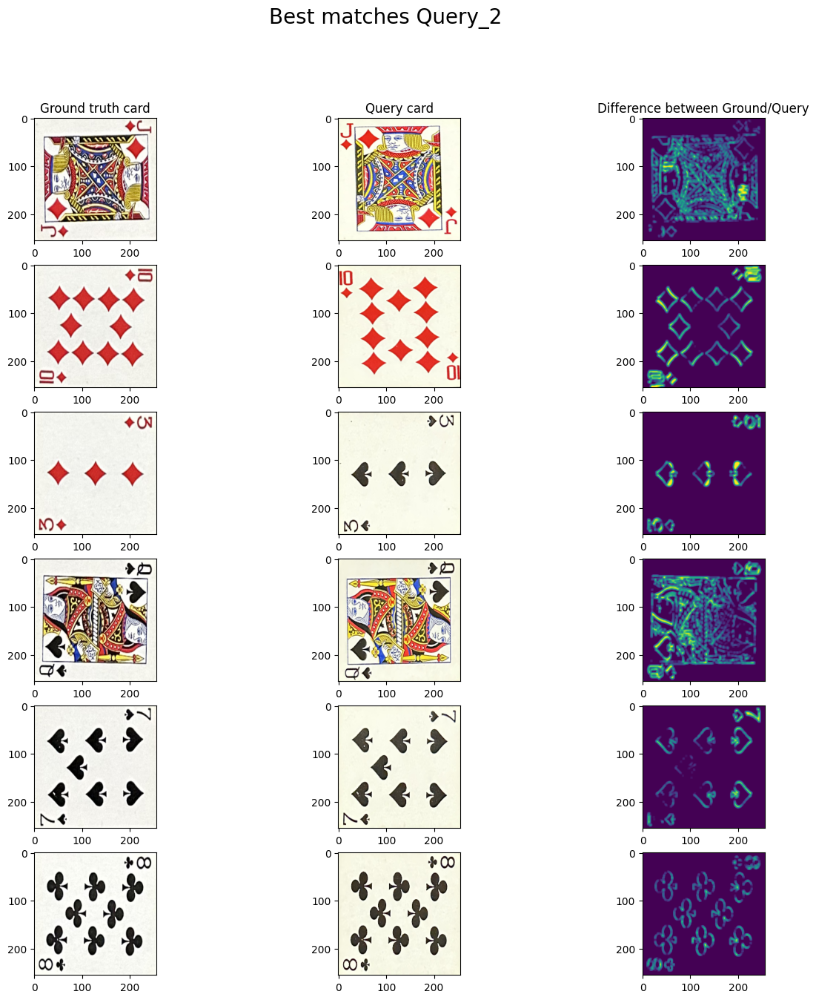

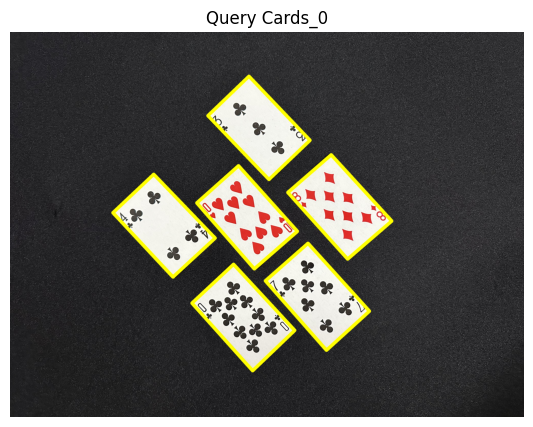

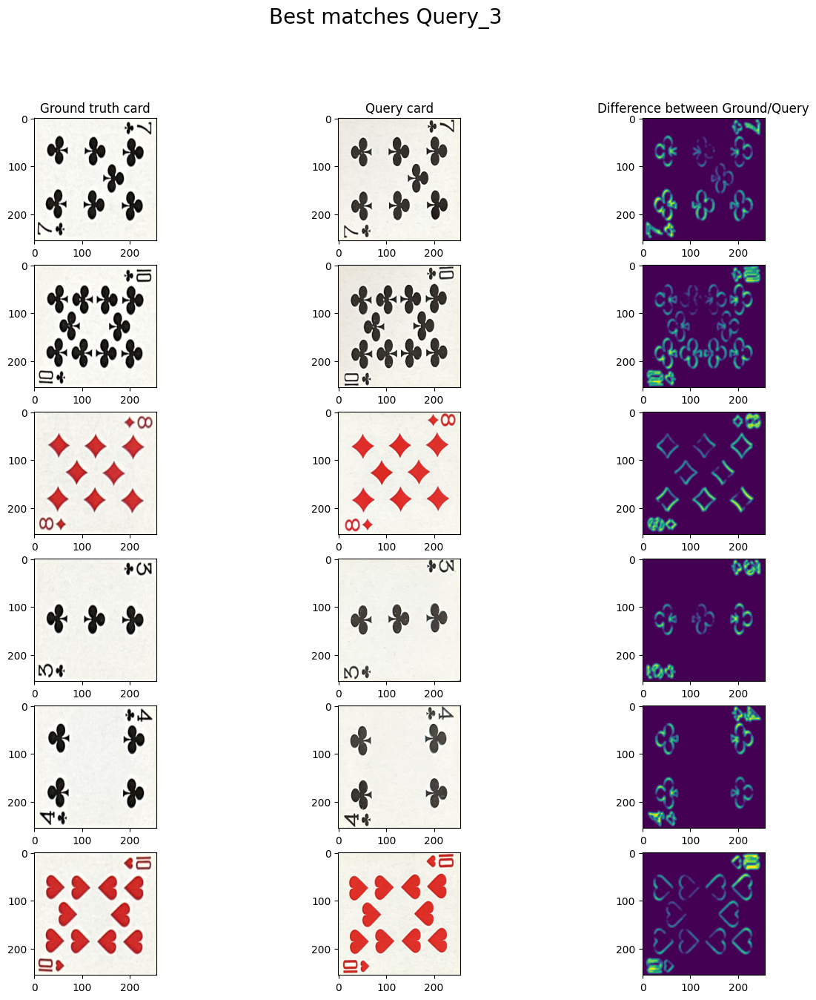

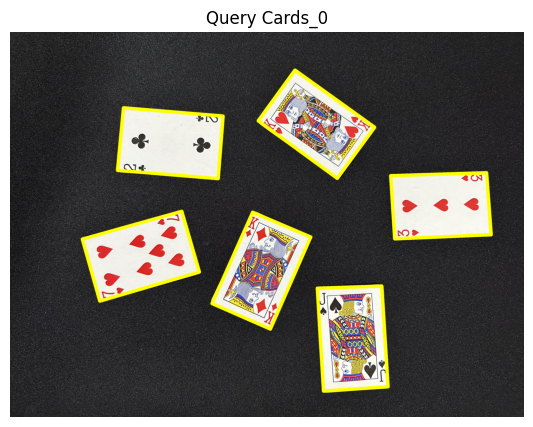

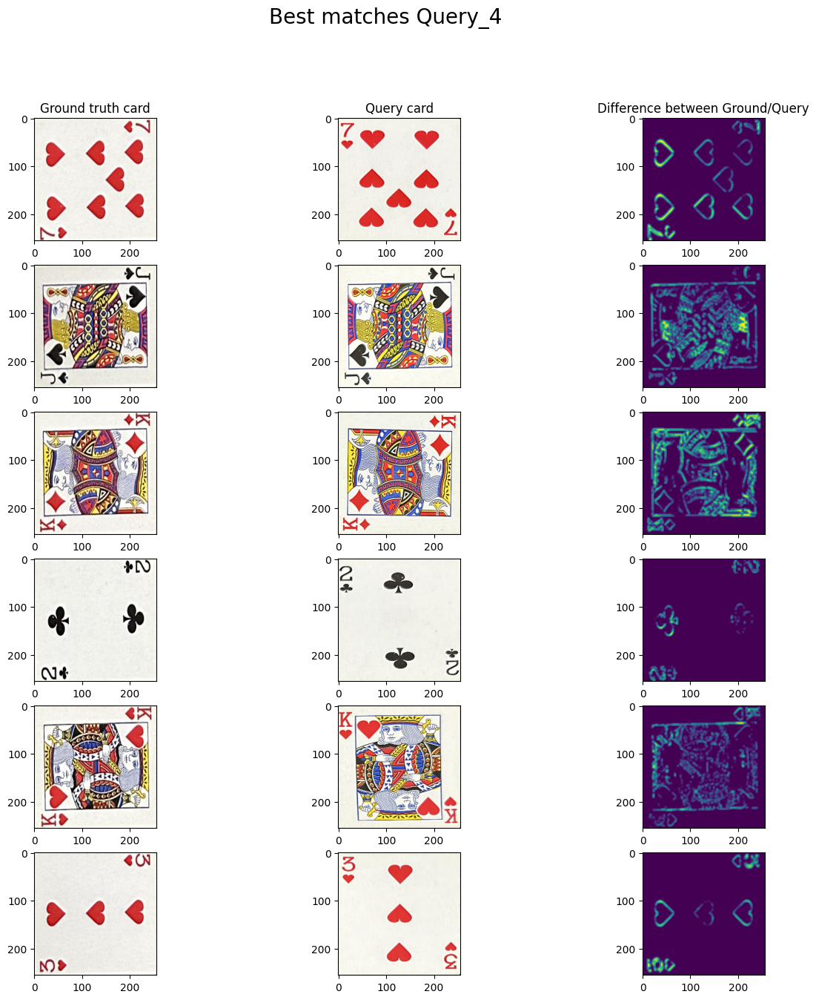

In [ ]:
for i, query_path in enumerate(query_close):
  query = read_heic(path_close+'/'+ query_path)
  query_cards, query_boxes = get_cards_from_photo(query,95)
  plot_image_with_boxes(query, query_boxes)
  titles = get_matches(query_cards, ground_cards, plot=True,title_name=i)

<ipython-input-227-8c3c50f1470e>:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours_sorted = np.array(sorted(contours, key=cv2.contourArea,reverse=True))


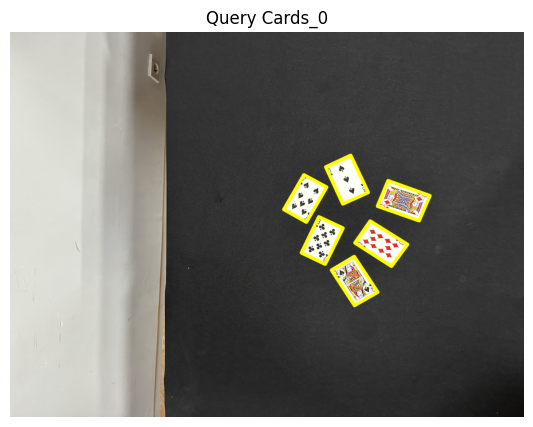

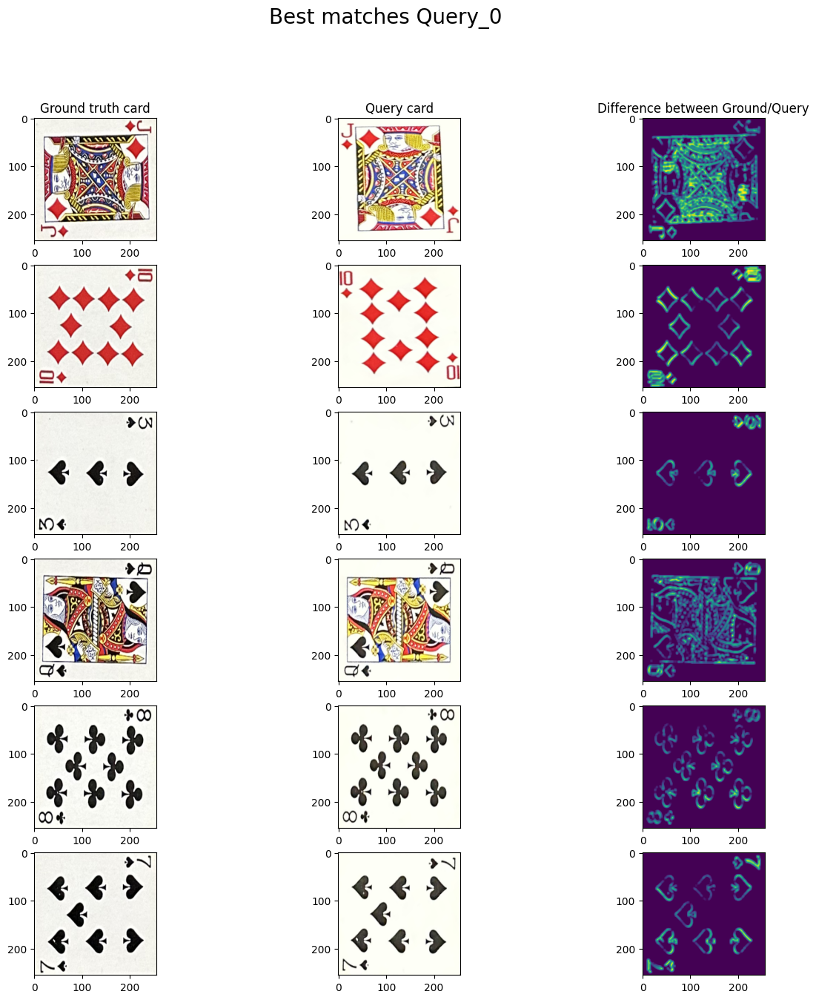

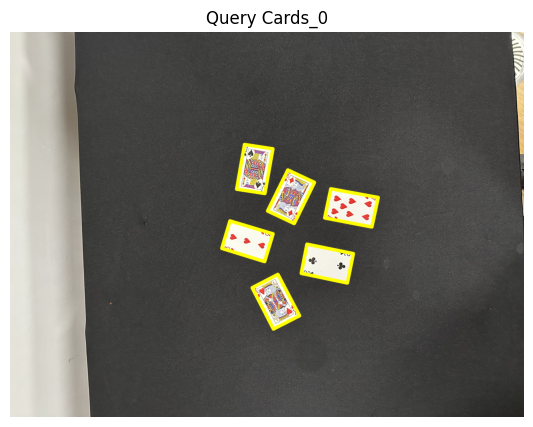

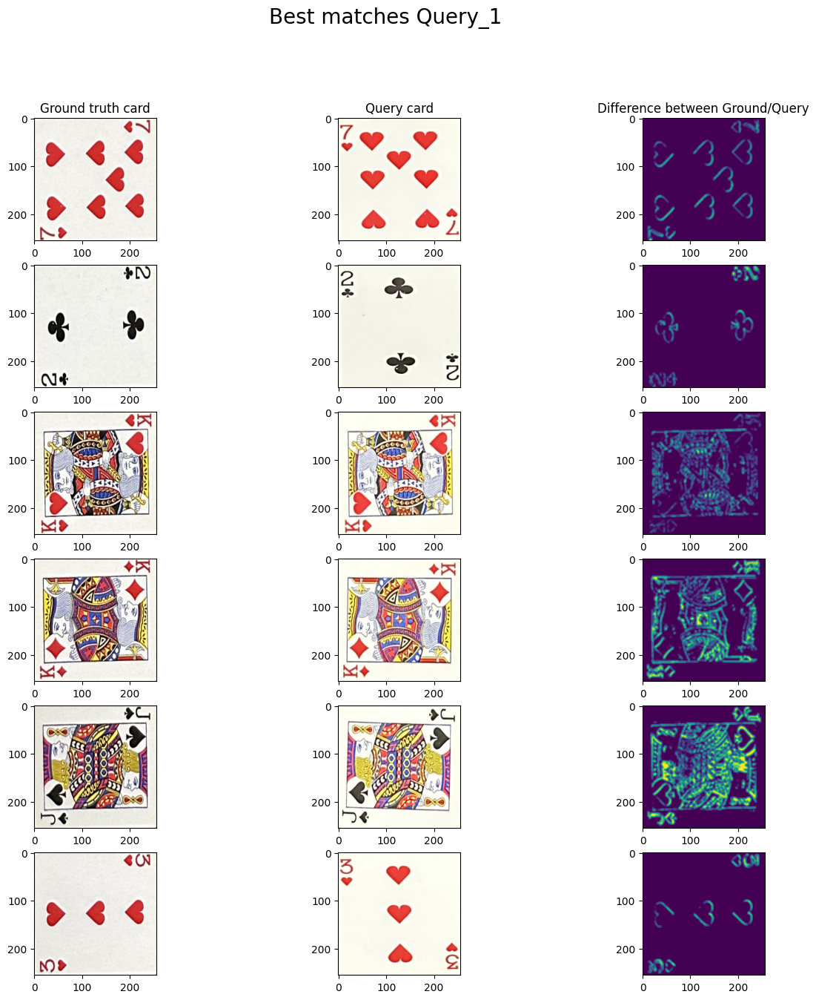

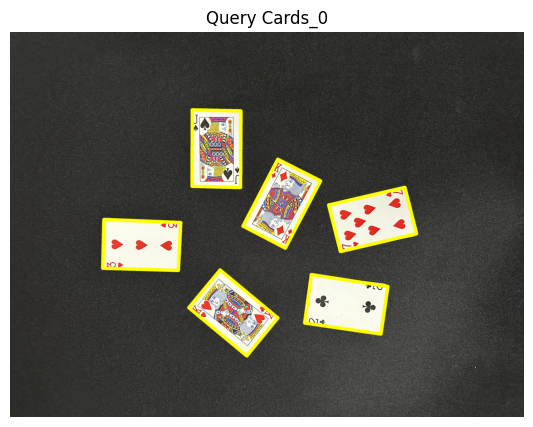

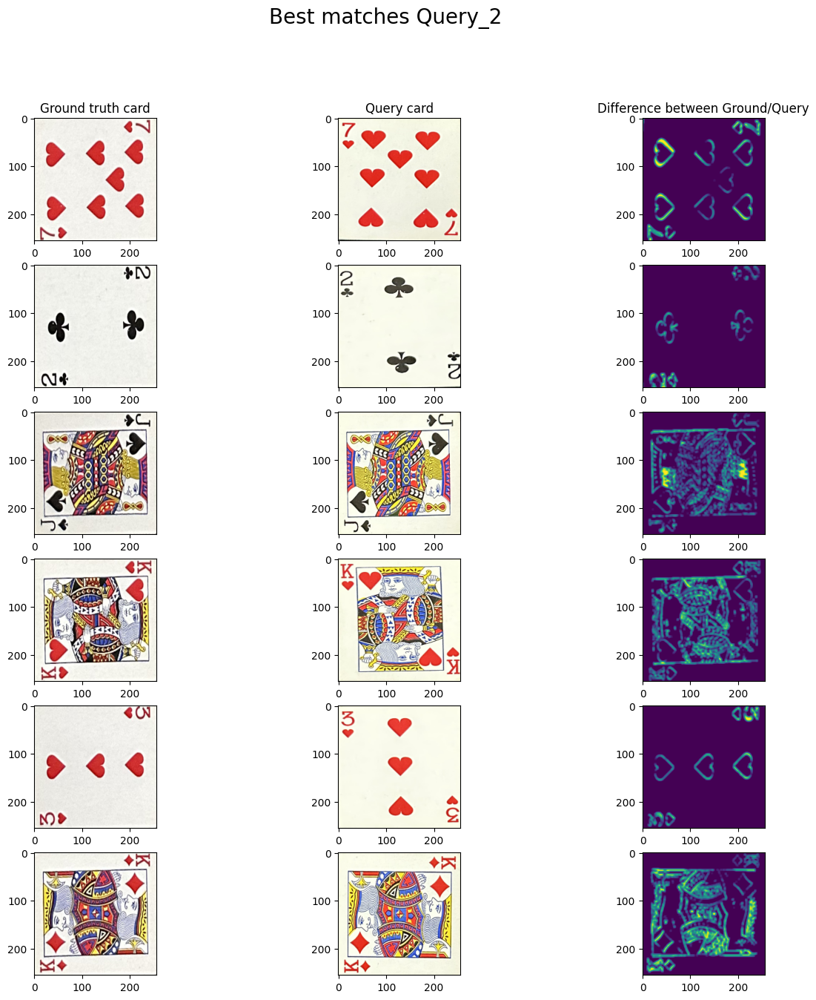

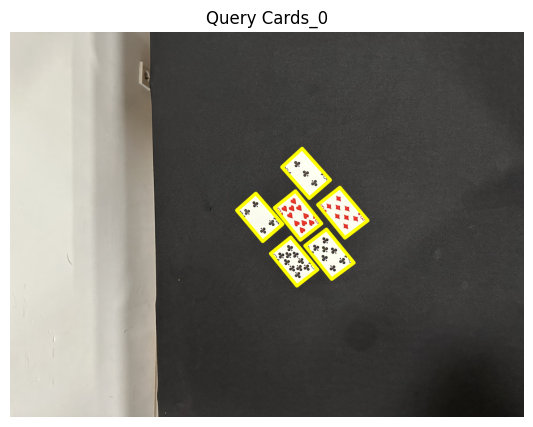

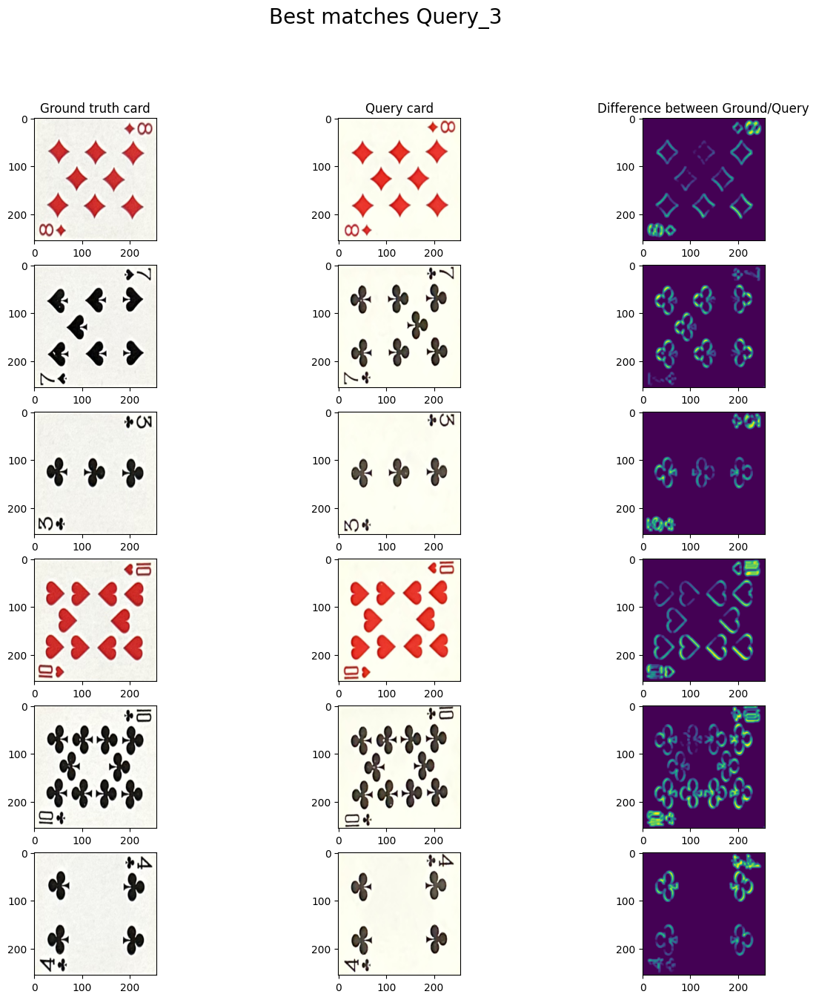

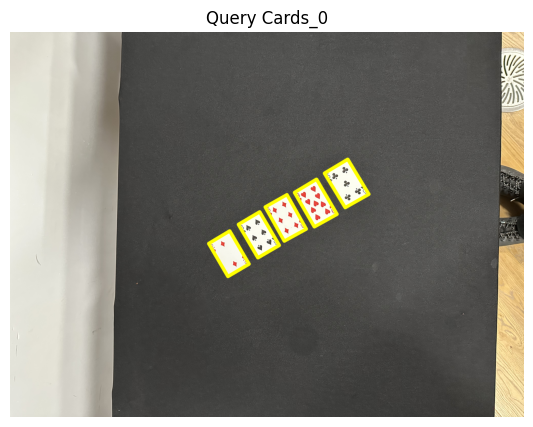

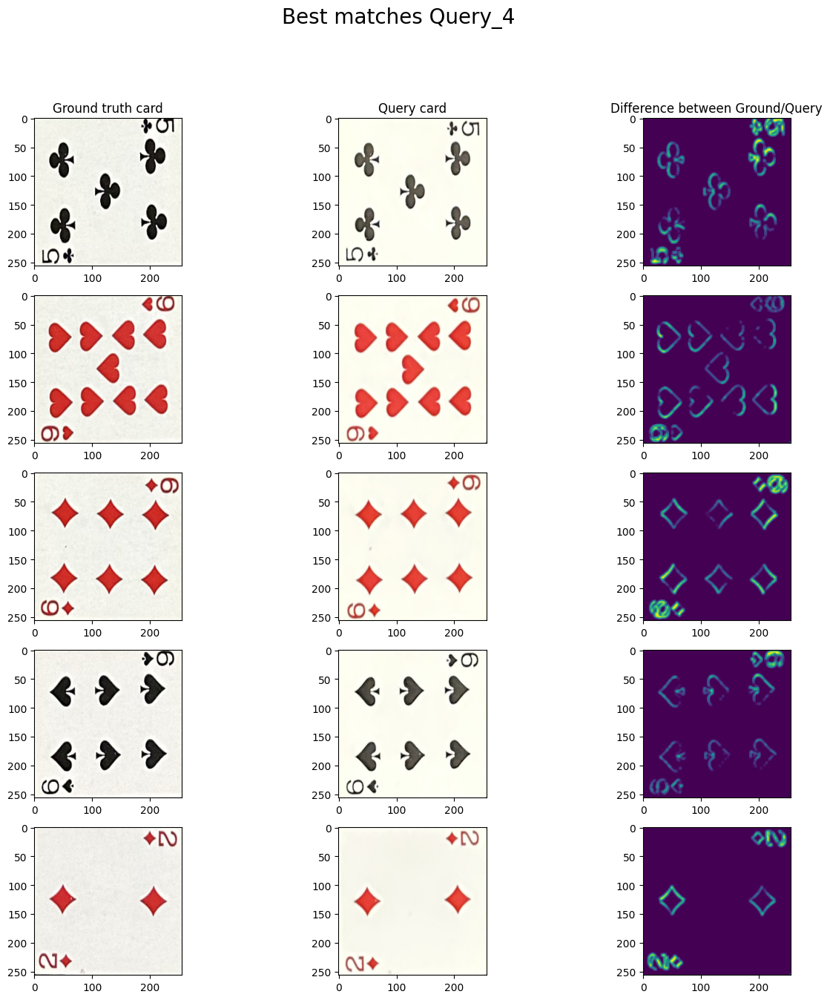

In [ ]:
for i, query_path in enumerate(query_normal):
  query = read_heic(path_normal + '/' + query_path)
  query_cards, query_boxes = get_cards_from_photo(query,95)
  plot_image_with_boxes(query, query_boxes)
  titles = get_matches(query_cards, ground_cards, plot=True,title_name=i)

<ipython-input-227-8c3c50f1470e>:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours_sorted = np.array(sorted(contours, key=cv2.contourArea,reverse=True))


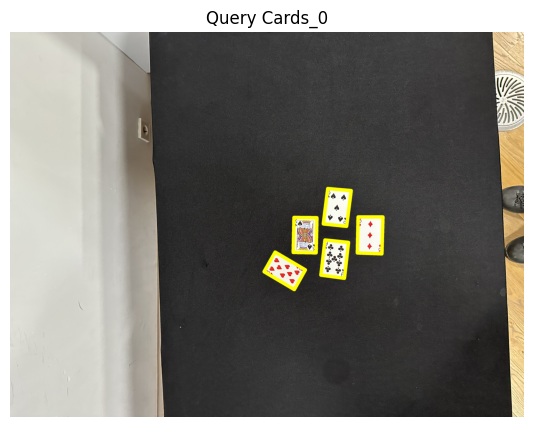

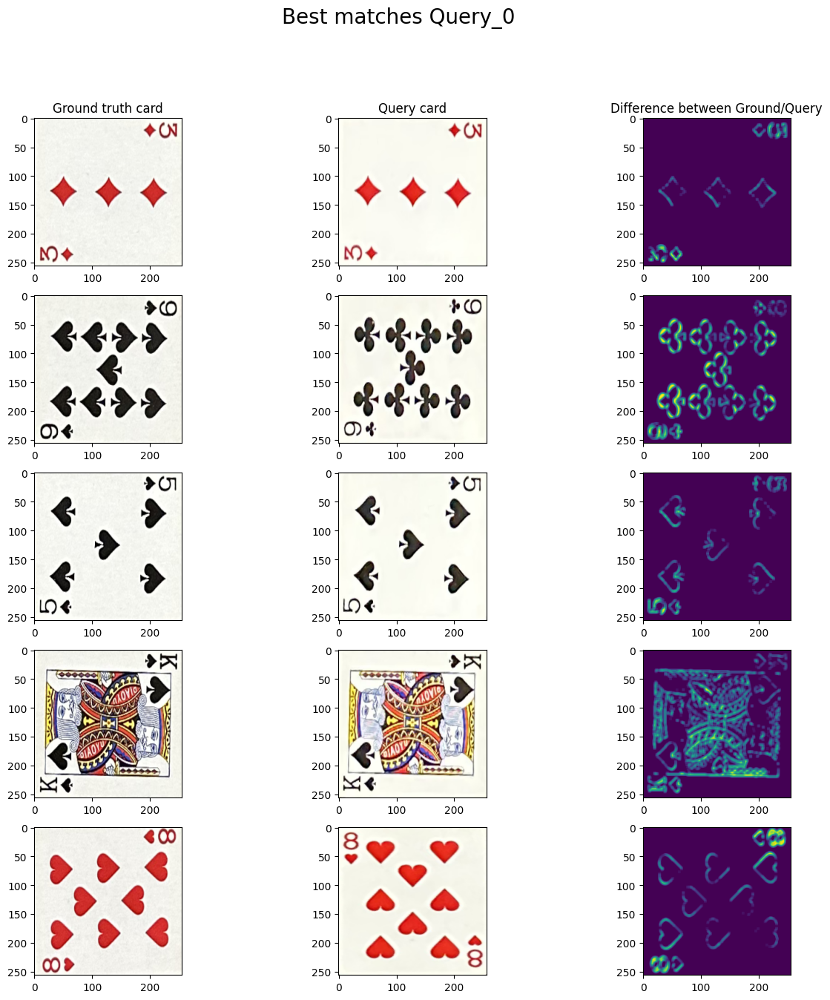

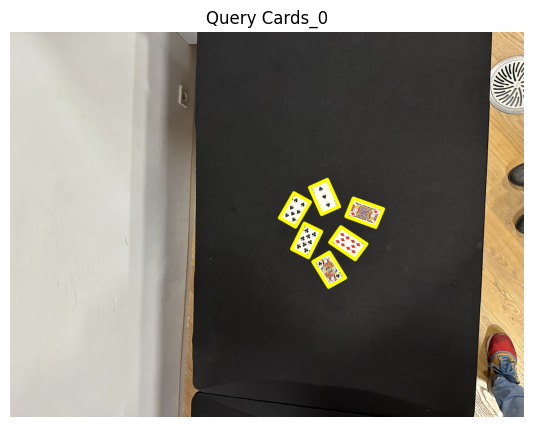

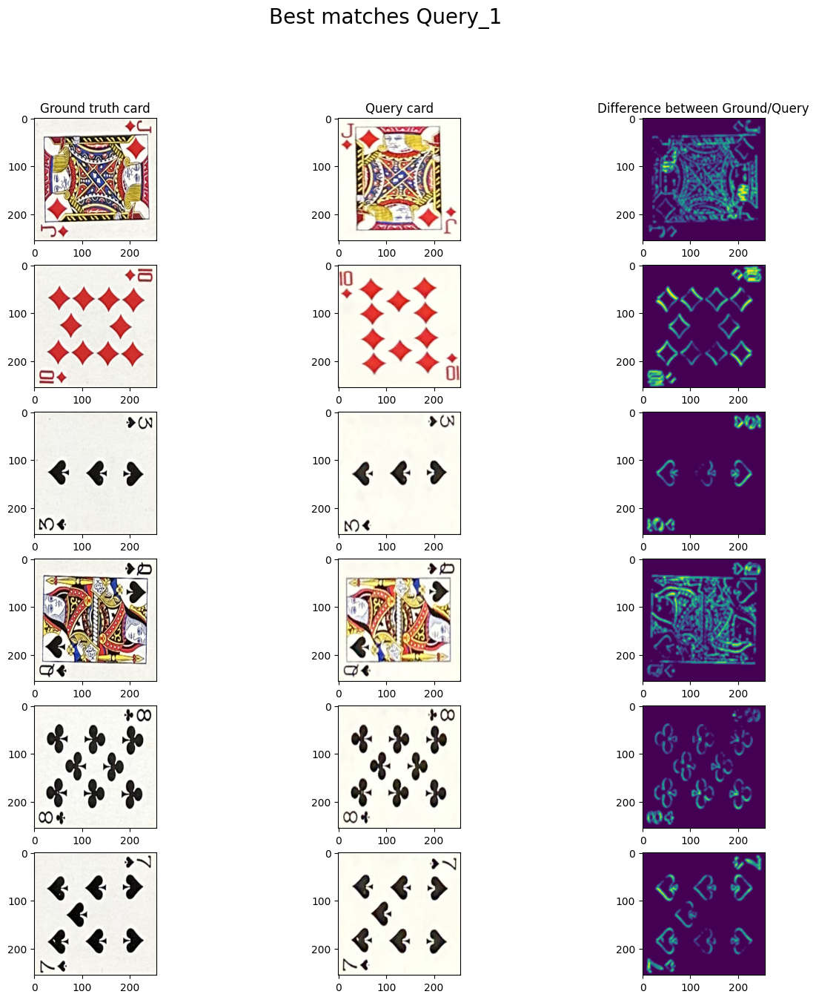

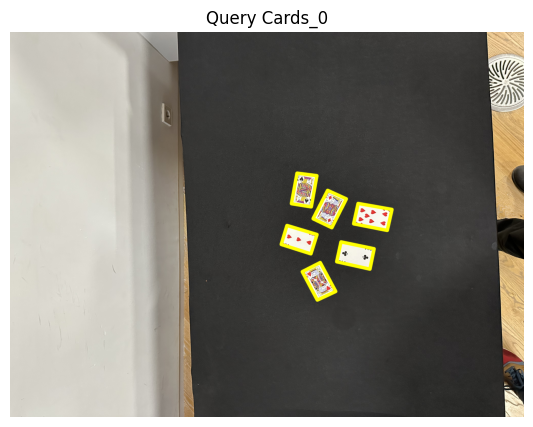

...

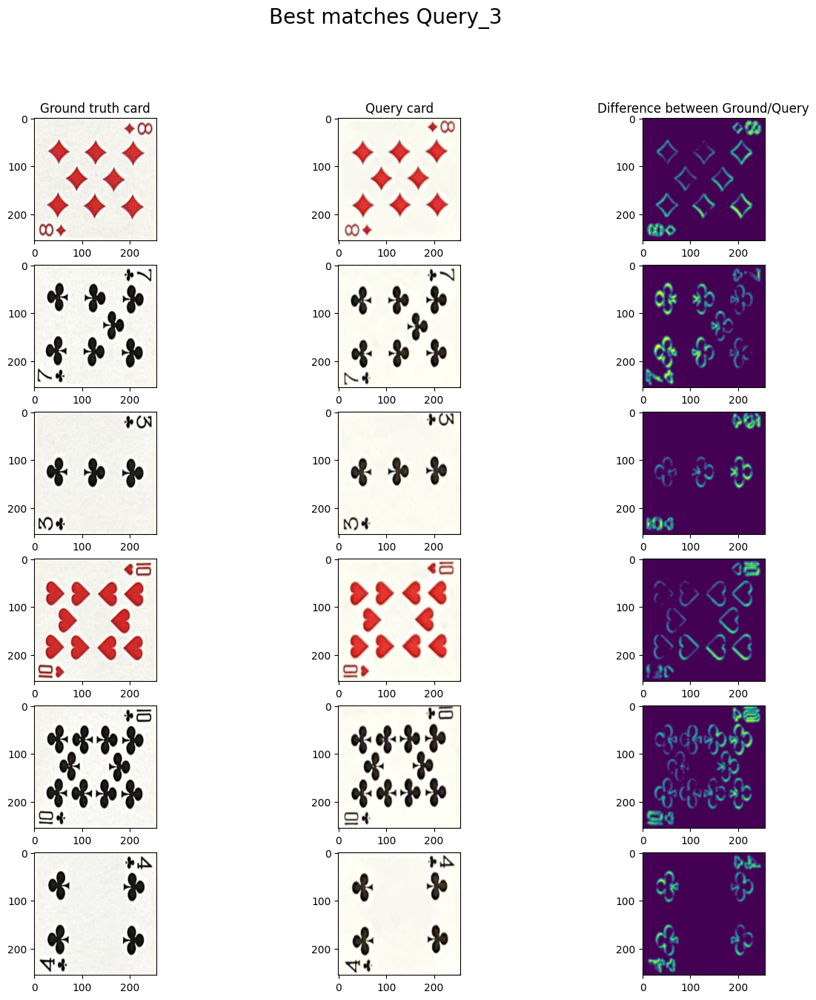

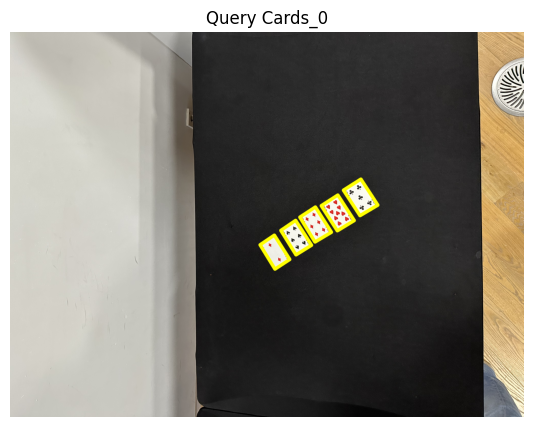

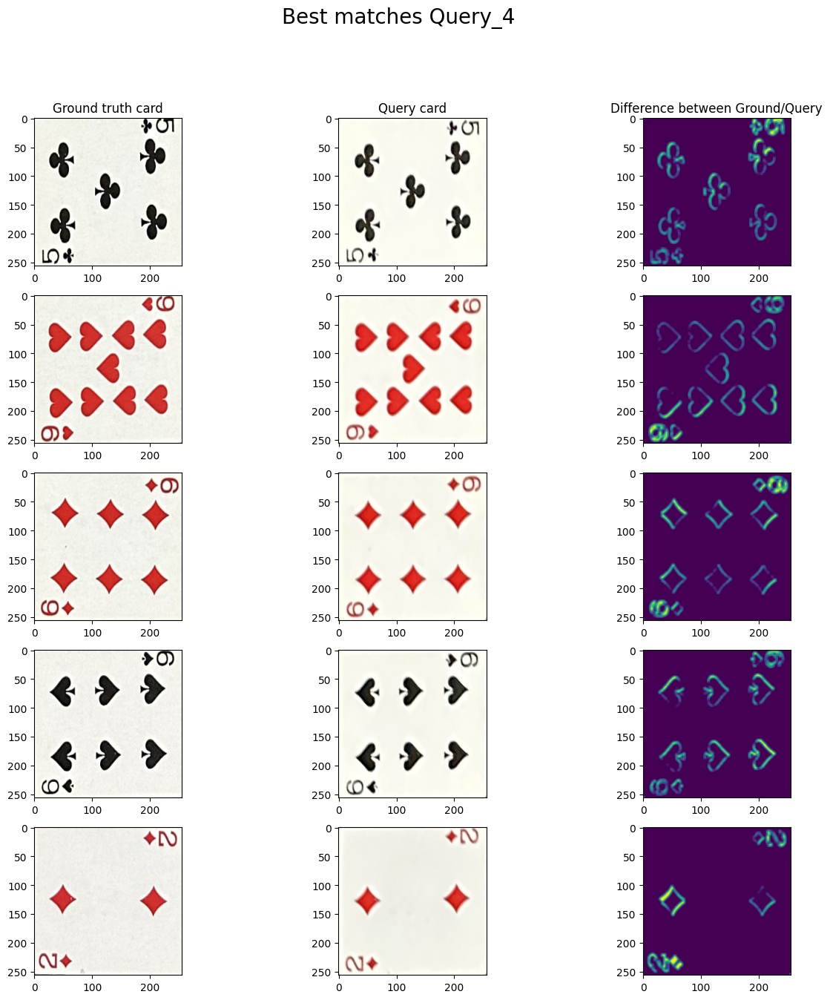

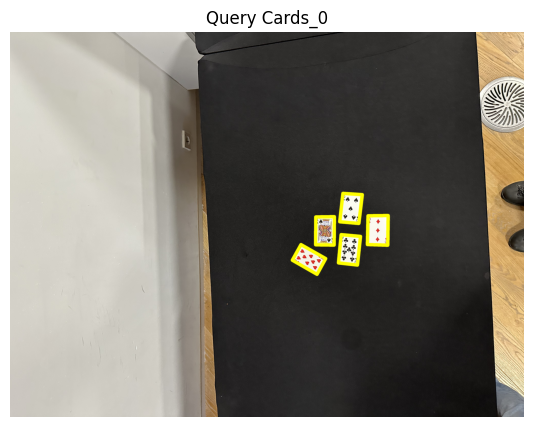

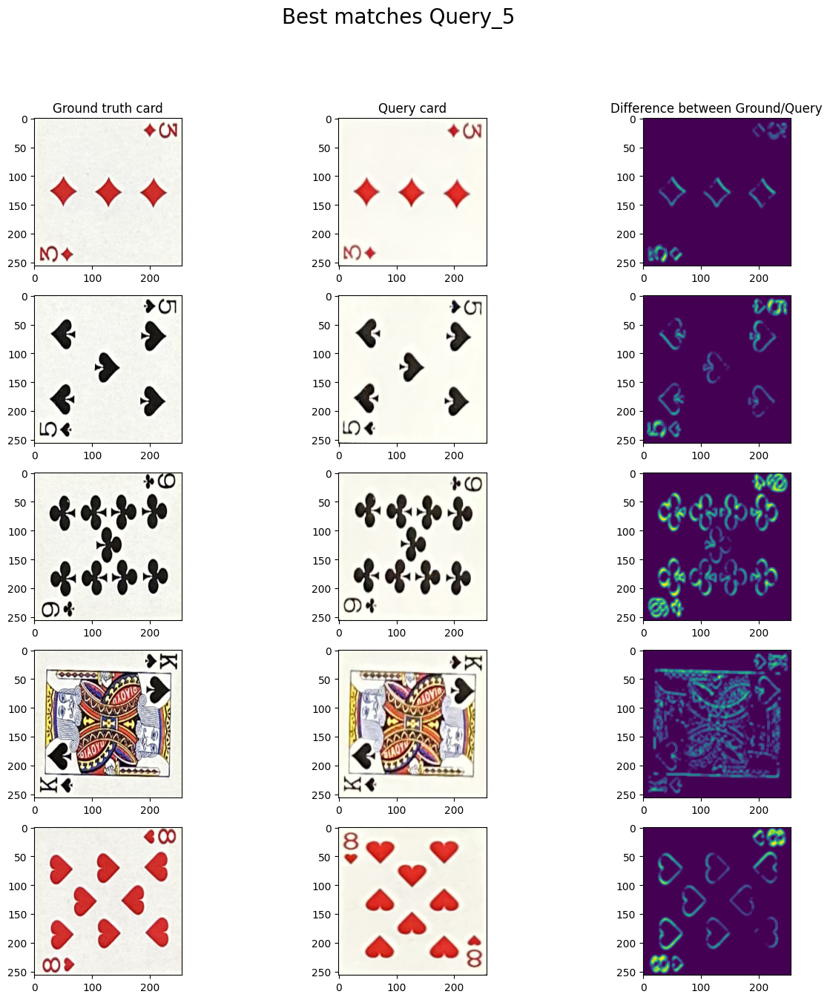

In [ ]:
for i, query_path in enumerate(query_far):
  query = read_heic(path_far + '/' + query_path)
  query_cards, query_boxes = get_cards_from_photo(query,95)
  plot_image_with_boxes(query, query_boxes)
  titles = get_matches(query_cards, ground_cards, plot=True,title_name=i)